In [64]:
pip install pandas numpy matplotlib cartopy


[notice] A new release of pip is available: 23.1.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [233]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
import numpy as np
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from scipy.stats import spearmanr

In [234]:
# Load data frames (replace 'data1.csv' and 'data2.csv' with your file paths)
df1 = pd.read_csv('GWS.csv')
df2 = pd.read_csv('recharge_with_coord.csv')
df2

,lat,lon,2003-01-15 00:00:00,2003-02-15 00:00:00,2003-03-15 00:00:00,2003-04-15 00:00:00,2003-05-15 00:00:00,2003-06-15 00:00:00,2003-07-15 00:00:00,2003-08-15 00:00:00,...,2014-03-15 00:00:00,2014-04-15 00:00:00,2014-05-15 00:00:00,2014-06-15 00:00:00,2014-07-15 00:00:00,2014-08-15 00:00:00,2014-09-15 00:00:00,2014-10-15 00:00:00,2014-11-15 00:00:00,2014-12-15 00:00:00
0,27.875,31.375,0.117917,0.037445,0.031139,0.043059,0.032451,0.029778,0.037662,0.036935,...,0.125192,0.379790,0.405382,0.240707,0.180818,0.159148,0.116869,0.098342,0.080150,0.074325
1,27.875,31.625,0.176378,0.053420,0.045770,0.055883,0.042992,0.037316,0.042863,0.041273,...,0.216304,0.533836,0.491260,0.294883,0.219995,0.185947,0.137381,0.114908,0.092752,0.088661
2,27.875,31.875,0.343629,0.099991,0.114001,0.117078,0.086958,0.070166,0.067739,0.066843,...,0.621630,0.817113,0.678292,0.438936,0.320214,0.256335,0.193181,0.157218,0.123750,0.128051
3,27.875,32.125,0.455442,0.133010,0.208234,0.227642,0.158476,0.124347,0.115224,0.125963,...,1.280425,1.082211,0.958502,0.636234,0.460764,0.374898,0.286763,0.224327,0.171804,0.179135
4,27.875,32.375,0.595644,0.170978,0.339615,0.378077,0.250854,0.193142,0.188029,0.208003,...,2.297246,1.572195,1.392986,0.914512,0.657371,0.550678,0.423360,0.317829,0.237099,0.250603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,96.772988,17.815239,8.175088,4.063623,10.163427,5.627854,8.971266,23.774272,...,20.056500,7.658954,25.261906,30.419326,25.358789,23.206425,33.970875,17.328129,19.246850,23.034309
6198,51.125,19.125,95.641839,17.821400,7.917759,3.992385,11.383339,5.881222,8.833718,25.173555,...,21.692461,7.847368,26.451429,31.853587,22.400234,25.058814,29.865191,16.255366,17.473019,22.845805
6199,51.125,19.375,94.408325,17.906836,7.871176,4.053029,13.688114,6.546657,9.045713,27.414889,...,23.856447,8.444328,30.701040,36.200521,21.769083,29.648357,28.456392,16.046104,16.195221,22.800258
6200,51.125,19.625,93.194514,17.787481,7.588753,3.962250,12.570707,6.247813,8.479983,27.482020,...,23.832563,8.822248,34.465160,33.813831,21.105550,32.927236,27.205586,15.763117,15.480643,22.153199


In [235]:
pd.reset_option('display.max_rows')

In [236]:
# Initialize a new data frame to store the correlation coefficients
correlation_df = pd.DataFrame(columns=['latitude', 'longitude', 'correlation'])

In [237]:
# Loop through each row and compute the correlation
for index, row in df1.iterrows():
    lat = row['lat']
    lon = row['lon']
    
    # Extract time series from both data frames
    ts1 = row[2:]
    ts2 = df2.iloc[index, 2:]
    
    # Compute the correlation coefficient
    corr = np.corrcoef(ts1, ts2)[0, 1]
    
    # Append the result to the correlation data frame
    correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\405020815

C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\405

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\405020815

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\4050208151.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

In [238]:
correlation_df

,latitude,longitude,correlation
0,27.875,31.375,0.075089
1,27.875,31.625,-0.005374
2,27.875,31.875,-0.038484
3,27.875,32.125,0.128917
4,27.875,32.375,0.113177
...,...,...,...
6197,51.125,18.875,-0.273622
6198,51.125,19.125,-0.272112
6199,51.125,19.375,-0.269344
6200,51.125,19.625,-0.259491


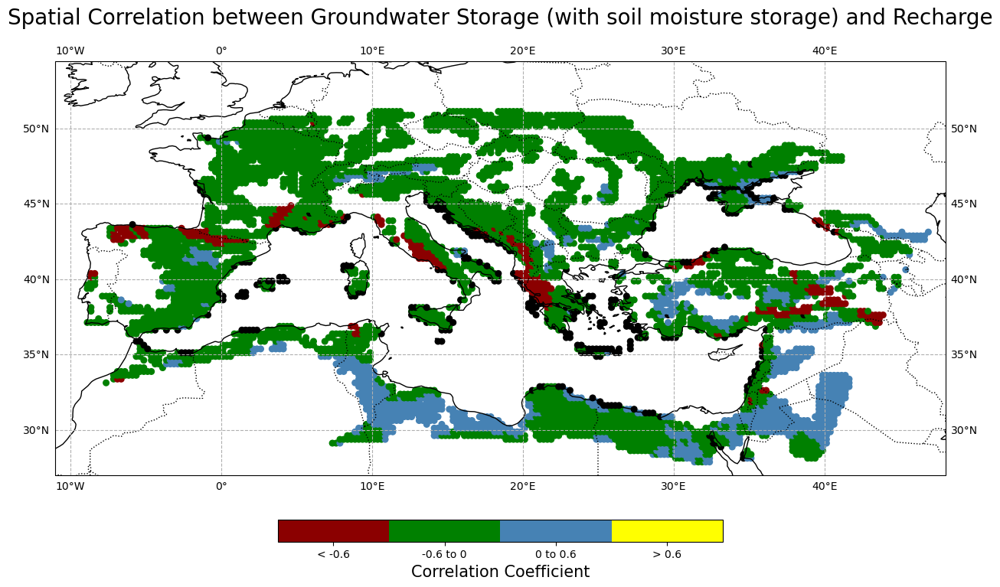

In [239]:
cmap = mcolors.ListedColormap(['darkred', 'green', 'steelblue', 'yellow'])
bounds = [-1, -0.6, 0, 0.6, 1]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

correlation_df['color'] = np.select(
    [correlation_df['correlation'] <= -0.6,
     (correlation_df['correlation'] > -0.6) & (correlation_df['correlation'] < 0),
     (correlation_df['correlation'] >= 0) & (correlation_df['correlation'] < 0.6),
     correlation_df['correlation'] >= 0.6],
    ['darkred', 'green', 'steelblue', 'yellow'])

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True, linestyle='--')

sc = ax.scatter(correlation_df['longitude'], correlation_df['latitude'], c=correlation_df['color'],
                marker='o', s=30, edgecolor=correlation_df['color'], transform=ccrs.PlateCarree())

# Create a ScalarMappable object for the colorbar
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # You need to set an empty array for the ScalarMappable object

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, ticks=[-0.8, -0.3, 0.3, 0.8], pad=0.05)
cbar.set_label('Correlation Coefficient', fontsize=15)
cbar.set_ticklabels(['< -0.6', '-0.6 to 0', '0 to 0.6', '> 0.6'])

ax.set_extent([-11, 48, 27, 51])

plt.title('Spatial Correlation between Groundwater Storage (with soil moisture storage) and Recharge', fontsize=20, pad =20)
plt.show()

In [257]:
corr_value = 0.48
correlation_df_subset = correlation_df[correlation_df['correlation'] > corr_value]
correlation_df_subset

,latitude,longitude,correlation,color
1385,34.125,37.125,0.484942,steelblue


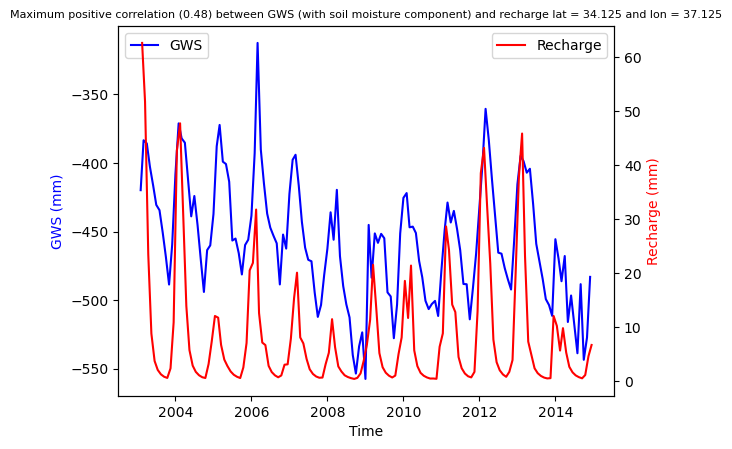

In [259]:
data1 = df1.iloc[:, 3:]
data2 = df2.iloc[:, 3:]

# Transpose the DataFrames so that the time component becomes the index
data1 = data1.T
data2 = data2.T

# Convert the index of each DataFrame to a proper datetime format
data1.index = pd.to_datetime(data1.index)
data2.index = pd.to_datetime(data2.index)

# Create a figure object and add two axes to it
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

#Specify the axis
index = 1385

# Plot the two time series on separate axes
ax1.plot(data1.iloc[:, index], label='GWS', color='b')
ax2.plot(data2.iloc[:, index], label='Recharge', color='r')

# Add axis labels and title
ax1.set_xlabel('Time')
ax1.set_ylabel('GWS (mm)', color='b')
ax2.set_ylabel('Recharge (mm)', color='r')
plt.title('Maximum positive correlation (0.48) between GWS (with soil moisture component) and recharge lat = 34.125 and lon = 37.125', fontsize=8)

# Add a legend and display the plot
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()


In [130]:
#=============================Pearson Correlation where the soil is not considered====================================================

In [131]:
# Load data frames (replace 'data1.csv' and 'data2.csv' with your file paths)
df1 = pd.read_csv('GWS_no_soil.csv')
df2 = pd.read_csv('recharge_with_coord.csv')
#df2.iloc[:, 2:] = df2.iloc[:, 2:] * 10 #tried to assume that the value of the recharge is in millimeter


In [132]:
# Initialize a new data frame to store the correlation coefficients
correlation_df = pd.DataFrame(columns=['latitude', 'longitude', 'correlation'])

In [133]:
# Loop through each row and compute the correlation
for index, row in df1.iterrows():
    lat = row['lat']
    lon = row['lon']
    
    # Extract time series from both data frames
    ts1 = row[2:]
    ts2 = df2.iloc[index, 2:]
    
    # Compute the correlation coefficient
    corr = np.corrcoef(ts1, ts2)[0, 1]
    
    # Append the result to the correlation data frame
    correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
    


C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\374

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\374

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib\function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\anaconda3\lib\site-packages\numpy\lib

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3740826649.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_92

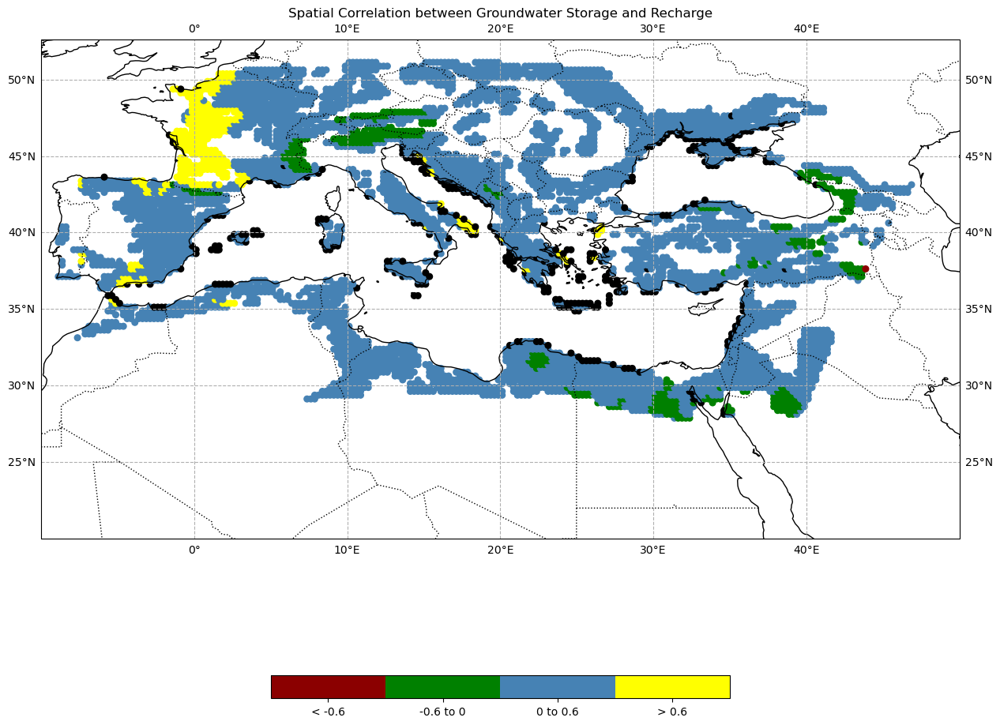

In [134]:
cmap = mcolors.ListedColormap(['darkred', 'green', 'steelblue', 'yellow'])
bounds = [-1, -0.6, 0, 0.6, 1]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

correlation_df['color'] = np.select(
    [correlation_df['correlation'] <= -0.6,
     (correlation_df['correlation'] > -0.6) & (correlation_df['correlation'] < 0),
     (correlation_df['correlation'] >= 0) & (correlation_df['correlation'] < 0.6),
     correlation_df['correlation'] >= 0.6],
    ['darkred', 'green', 'steelblue', 'yellow'])

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True, linestyle='--')

sc = ax.scatter(correlation_df['longitude'], correlation_df['latitude'], c=correlation_df['color'],
                marker='o', s=30, edgecolor=correlation_df['color'], transform=ccrs.PlateCarree())

# Create a ScalarMappable object for the colorbar
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # You need to set an empty array for the ScalarMappable object

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, ticks=[-0.8, -0.3, 0.3, 0.8])
cbar.set_ticklabels(['< -0.6', '-0.6 to 0', '0 to 0.6', '> 0.6'])

ax.set_extent([-10, 50, 20, 49])

plt.title('Spatial Correlation between Groundwater Storage and Recharge')
plt.show()

In [135]:
correlation_df_subset = correlation_df[correlation_df['correlation'] > 0.8]
correlation_df_subset

,latitude,longitude,correlation,color
3964,43.875,15.625,0.80222,yellow


In [136]:
correlation_df['correlation'].max()

0.802220186481564

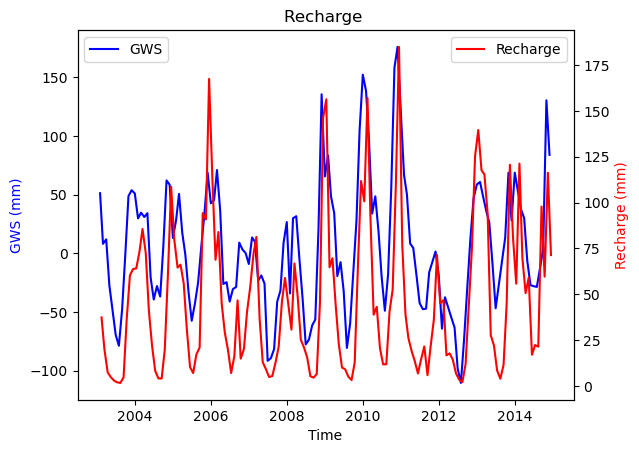

In [137]:
data1 = df1.iloc[:, 3:]
data2 = df2.iloc[:, 3:]

# Transpose the DataFrames so that the time component becomes the index
data1 = data1.T
data2 = data2.T

# Convert the index of each DataFrame to a proper datetime format
data1.index = pd.to_datetime(data1.index)
data2.index = pd.to_datetime(data2.index)

# Create a figure object and add two axes to it
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

#Specify the axis
index = 3964

# Plot the two time series on separate axes
ax1.plot(data1.iloc[:, index], label='GWS', color='b')
ax2.plot(data2.iloc[:, index], label='Recharge', color='r')

# Add axis labels and title
ax1.set_xlabel('Time')
ax1.set_ylabel('GWS (mm)', color='b')
ax2.set_ylabel('Recharge (mm)', color='r')
plt.title('Recharge ')

# Add a legend and display the plot
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()


In [282]:
#==========================================USING THE SPEARMANS RANK CORRELATION COEFFICIENT==================================#

In [302]:
# Load data frames (replace 'data1.csv' and 'data2.csv' with your file paths)
df1 = pd.read_csv('GWS.csv')
df2 = pd.read_csv('recharge_with_coord.csv')
#df2.iloc[:, 2:] = df2.iloc[:, 2:] * 10 #tried to assume that the value of the recharge is in millimeter


In [303]:
# Create an empty DataFrame to store the results
correlation_df = pd.DataFrame(columns=['latitude', 'longitude', 'correlation', 'p_value'])

In [304]:
# Loop through each row and compute the correlation
for index, row in df1.iterrows():
    lat = row['lat']
    lon = row['lon']
    
    # Extract time series from both data frames
    ts1 = row[2:]
    ts2 = df2.iloc[index, 2:]
    
    # Compute the Spearman rank correlation coefficient and p-value
    corr, p_value = spearmanr(ts1, ts2)
    
    # Append the result to the correlation data frame
    correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)

# View the correlation_df
print(correlation_df)

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4878: ConstantInputWarning: An inp

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append met

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

      latitude  longitude  correlation   p_value
0       27.875     31.375    -0.303963  0.000212
1       27.875     31.625     0.304276  0.000209
2       27.875     31.875     0.101949  0.224023
3       27.875     32.125    -0.226959  0.006227
4       27.875     32.375    -0.235311  0.004524
...        ...        ...          ...       ...
6197    51.125     18.875    -0.331882  0.000048
6198    51.125     19.125    -0.316064  0.000114
6199    51.125     19.375    -0.289060  0.000442
6200    51.125     19.625    -0.277538  0.000758
6201    51.125     19.875    -0.270424  0.001045

[6202 rows x 4 columns]


C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

In [305]:
correlation_df

,latitude,longitude,correlation,p_value
0,27.875,31.375,-0.303963,0.000212
1,27.875,31.625,0.304276,0.000209
2,27.875,31.875,0.101949,0.224023
3,27.875,32.125,-0.226959,0.006227
4,27.875,32.375,-0.235311,0.004524
...,...,...,...,...
6197,51.125,18.875,-0.331882,0.000048
6198,51.125,19.125,-0.316064,0.000114
6199,51.125,19.375,-0.289060,0.000442
6200,51.125,19.625,-0.277538,0.000758


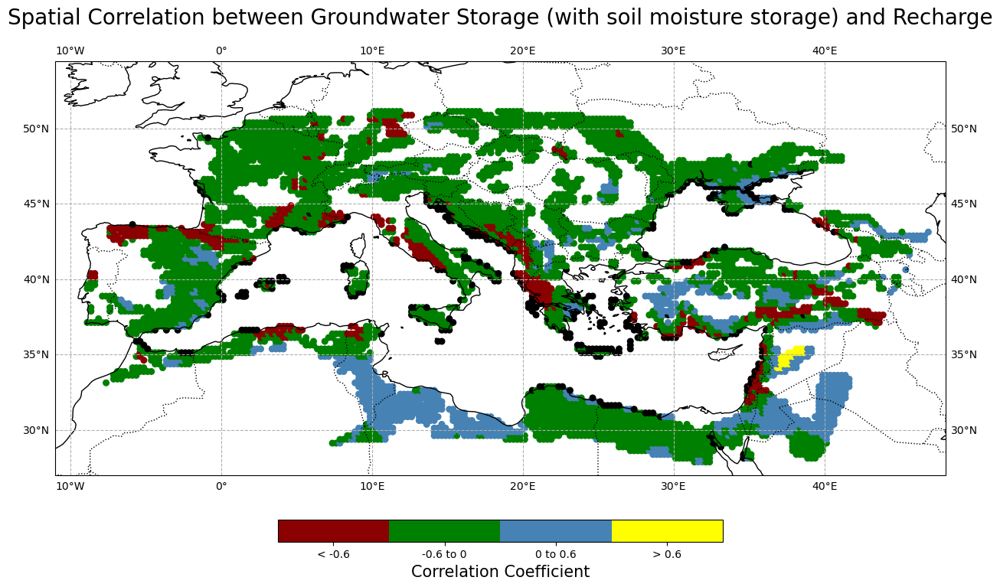

In [306]:
cmap = mcolors.ListedColormap(['darkred', 'green', 'steelblue', 'yellow'])
bounds = [-1, -0.6, 0, 0.6, 1]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

correlation_df['color'] = np.select(
    [correlation_df['correlation'] <= -0.6,
     (correlation_df['correlation'] > -0.6) & (correlation_df['correlation'] < 0),
     (correlation_df['correlation'] >= 0) & (correlation_df['correlation'] < 0.6),
     correlation_df['correlation'] >= 0.6],
    ['darkred', 'green', 'steelblue', 'yellow'])

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True, linestyle='--')

sc = ax.scatter(correlation_df['longitude'], correlation_df['latitude'], c=correlation_df['color'],
                marker='o', s=30, edgecolor=correlation_df['color'], transform=ccrs.PlateCarree())

# Create a ScalarMappable object for the colorbar
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # You need to set an empty array for the ScalarMappable object

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, ticks=[-0.8, -0.3, 0.3, 0.8], pad=0.05)
cbar.set_label('Correlation Coefficient', fontsize=15)
cbar.set_ticklabels(['< -0.6', '-0.6 to 0', '0 to 0.6', '> 0.6'])

ax.set_extent([-11, 48, 27, 51])

plt.title('Spatial Correlation between Groundwater Storage (with soil moisture storage) and Recharge', fontsize=20, pad =20)
plt.show()

In [307]:
corr_value = -0.84
correlation_df_subset = correlation_df[correlation_df['correlation'] < corr_value]
correlation_df_subset

,latitude,longitude,correlation,p_value,color
2741,39.875,20.375,-0.842296,6.105985e-40,darkred


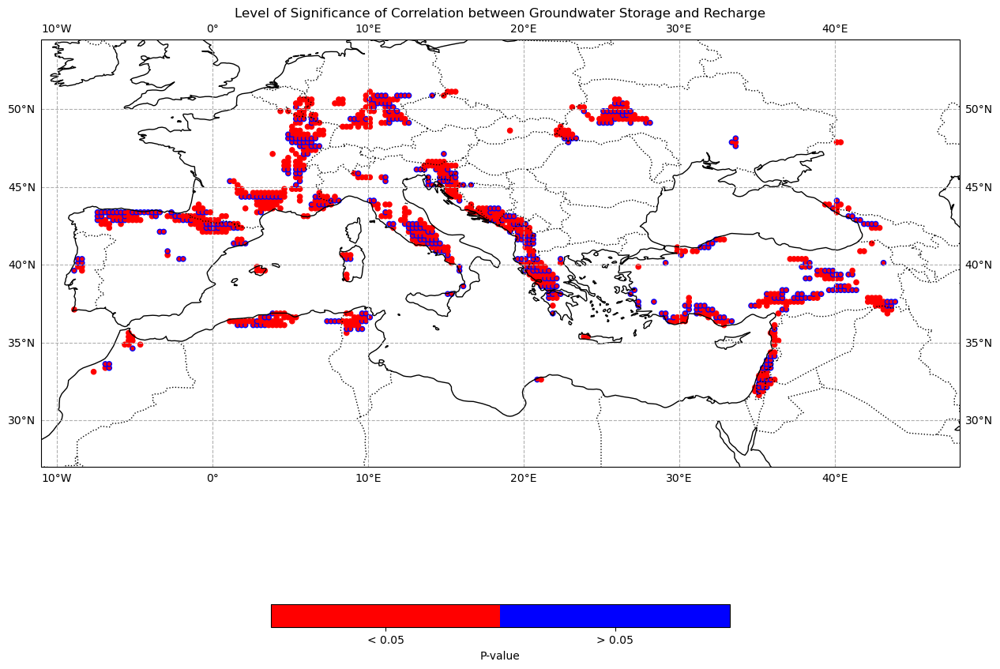

In [275]:
# # Plot the correlation coefficients on a map
# fig = plt.figure(figsize=(15, 15))
# ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# # Add geographical features
# ax.add_feature(cfeature.COASTLINE)
# ax.add_feature(cfeature.BORDERS, linestyle=':')
# ax.gridlines(draw_labels=True, linestyle='--')

# # Define custom colormap and normalization function
# cmap = mcolors.ListedColormap(['red', 'blue'])
# norm = mcolors.BoundaryNorm([0, 0.05, 1], cmap.N)

# # Determine the colors for each point based on the p_value column
# colors = cmap(norm(correlation_df['p_value'].values))

# # Plot the correlation coefficients as scatter points with the same edgecolor as the points
# sc = ax.scatter(correlation_df_subset['longitude'], correlation_df_subset['latitude'], c=correlation_df_subset['p_value'],
#                 cmap=cmap, norm=norm, marker='o', s=20, edgecolor=colors, linewidth=1, transform=ccrs.PlateCarree())

# # Add a colorbar
# cbar = plt.colorbar(sc, orientation='horizontal', shrink=0.5, ticks=[0.025, 0.525])
# cbar.set_label('P-value')
# cbar.ax.set_xticklabels(['< 0.05', '> 0.05'])

# # Set map extent (optional)
# ax.set_extent([-11, 48, 27, 51])

# plt.title('Level of Significance of Correlation between Groundwater Storage and Recharge')
# plt.show()

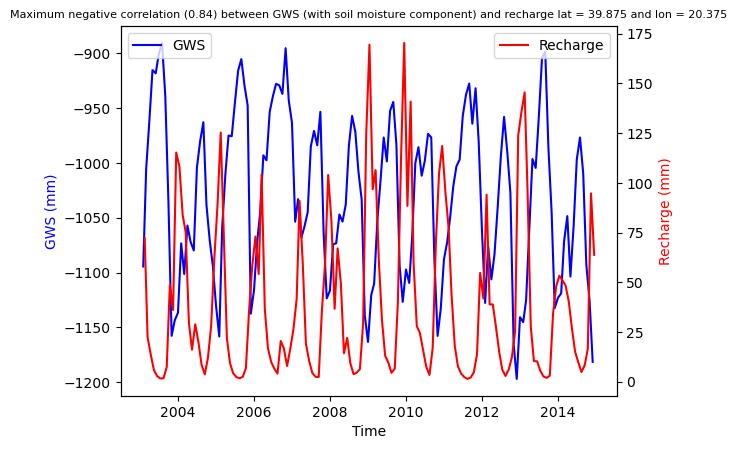

In [309]:
data1 = df1.iloc[:, 3:]
data2 = df2.iloc[:, 3:]

# Transpose the DataFrames so that the time component becomes the index
data1 = data1.T
data2 = data2.T

# Convert the index of each DataFrame to a proper datetime format
data1.index = pd.to_datetime(data1.index)
data2.index = pd.to_datetime(data2.index)

# Create a figure object and add two axes to it
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

#Specify the axis
index = 2741

# Plot the two time series on separate axes
ax1.plot(data1.iloc[:, index], label='GWS', color='b')
ax2.plot(data2.iloc[:, index], label='Recharge', color='r')

# Add axis labels and title
ax1.set_xlabel('Time')
ax1.set_ylabel('GWS (mm)', color='b')
ax2.set_ylabel('Recharge (mm)', color='r')
plt.title('Maximum negative correlation (0.84) between GWS (with soil moisture component) and recharge lat = 39.875 and lon = 20.375', fontsize=8)

# Add a legend and display the plot
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()


In [310]:
#=============================Spearman's Rank Correlation where the soil is not considered====================================================

In [311]:
# Load data frames (replace 'data1.csv' and 'data2.csv' with your file paths)
df1 = pd.read_csv('GWS_no_soil.csv')
df2 = pd.read_csv('recharge_with_coord.csv')
#df2.iloc[:, 2:] = df2.iloc[:, 2:] * 10 #tried to assume that the value of the recharge is in millimeter


In [312]:
# Initialize a new data frame to store the correlation coefficients
correlation_df = pd.DataFrame(columns=['latitude', 'longitude', 'correlation', 'p_value'])

In [313]:
# Loop through each row and compute the correlation
for index, row in df1.iterrows():
    lat = row['lat']
    lon = row['lon']
    
    # Extract time series from both data frames
    ts1 = row[2:]
    ts2 = df2.iloc[index, 2:]
    
    # Compute the Spearman rank correlation coefficient and p-value
    corr, p_value = spearmanr(ts1, ts2)
    
    # Append the result to the correlation data frame
    correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)

# View the correlation_df
print(correlation_df)

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

      latitude  longitude  correlation   p_value
0       27.875     31.375     0.334889  0.000041
1       27.875     31.625     0.303541  0.000217
2       27.875     31.875     0.221075  0.007749
3       27.875     32.125     0.166876  0.045598
4       27.875     32.375     0.141255  0.091265
...        ...        ...          ...       ...
6197    51.125     18.875     0.289977  0.000423
6198    51.125     19.125     0.282296  0.000608
6199    51.125     19.375     0.267286  0.001201
6200    51.125     19.625     0.251121  0.002397
6201    51.125     19.875     0.247870  0.002741

[6202 rows x 4 columns]


C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_9256\3594729173.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append({'latitude': lat, 'longitude': lon, 'correlation': corr, 'p_value': p_value}, ignor

In [185]:
correlation_df

,latitude,longitude,correlation,p_value
0,27.875,31.375,0.334889,0.000041
1,27.875,31.625,0.303541,0.000217
2,27.875,31.875,0.221075,0.007749
3,27.875,32.125,0.166876,0.045598
4,27.875,32.375,0.141255,0.091265
...,...,...,...,...
6197,51.125,18.875,0.289977,0.000423
6198,51.125,19.125,0.282296,0.000608
6199,51.125,19.375,0.267286,0.001201
6200,51.125,19.625,0.251121,0.002397


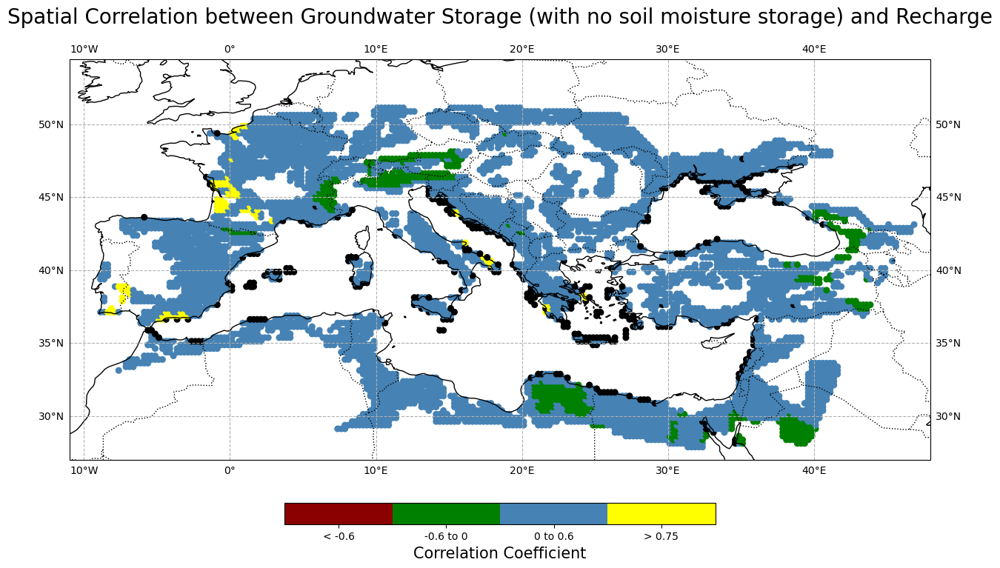

In [330]:
cmap = mcolors.ListedColormap(['darkred', 'green', 'steelblue', 'yellow'])
bounds = [-1, -0.6, 0, 0.6, 1]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

correlation_df['color'] = np.select(
    [correlation_df['correlation'] <= -0.6,
     (correlation_df['correlation'] > -0.6) & (correlation_df['correlation'] < 0),
     (correlation_df['correlation'] >= 0) & (correlation_df['correlation'] < 0.75),
     correlation_df['correlation'] >= 0.75],
    ['darkred', 'green', 'steelblue', 'yellow'])

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True, linestyle='--')

sc = ax.scatter(correlation_df['longitude'], correlation_df['latitude'], c=correlation_df['color'],
                marker='o', s=30, edgecolor=correlation_df['color'], transform=ccrs.PlateCarree())

# Create a ScalarMappable object for the colorbar
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # You need to set an empty array for the ScalarMappable object

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, ticks=[-0.8, -0.3, 0.3, 0.8], pad=0.05)
cbar.set_label('Correlation Coefficient', fontsize=15)
cbar.set_ticklabels(['< -0.6', '-0.6 to 0', '0 to 0.6', '> 0.75'])

ax.set_extent([-11, 48, 27, 51])

plt.title('Spatial Correlation between Groundwater Storage (with no soil moisture storage) and Recharge', fontsize=20, pad =20)
plt.show()

In [326]:
corr_value = -0.53
correlation_df_subset = correlation_df[correlation_df['correlation'] < corr_value]
correlation_df_subset

,latitude,longitude,correlation,p_value,color
2143,37.625,43.875,-0.53003,8.394810e-12,green


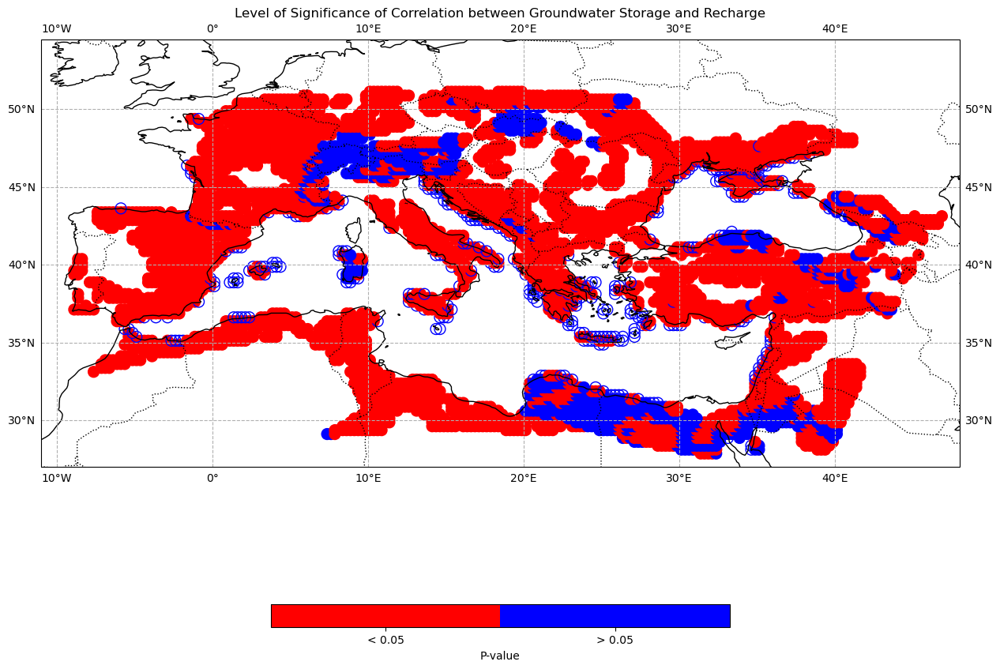

In [191]:
# Plot the correlation coefficients on a map
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographical features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True, linestyle='--')

# Define custom colormap and normalization function
cmap = mcolors.ListedColormap(['red', 'blue'])
norm = mcolors.BoundaryNorm([0, 0.05, 1], cmap.N)

# Determine the colors for each point based on the p_value column
colors = cmap(norm(correlation_df['p_value'].values))

# Plot the correlation coefficients as scatter points with the same edgecolor as the points
sc = ax.scatter(correlation_df['longitude'], correlation_df['latitude'], c=correlation_df['p_value'],
                cmap=cmap, norm=norm, marker='o', s=100, edgecolor=colors, linewidth=1, transform=ccrs.PlateCarree())

# Add a colorbar
cbar = plt.colorbar(sc, orientation='horizontal', shrink=0.5, ticks=[0.025, 0.525])
cbar.set_label('P-value')
cbar.ax.set_xticklabels(['< 0.05', '> 0.05'])

# Set map extent (optional)
ax.set_extent([-11, 48, 27, 51])

plt.title('Level of Significance of Correlation between Groundwater Storage and Recharge')
plt.show()

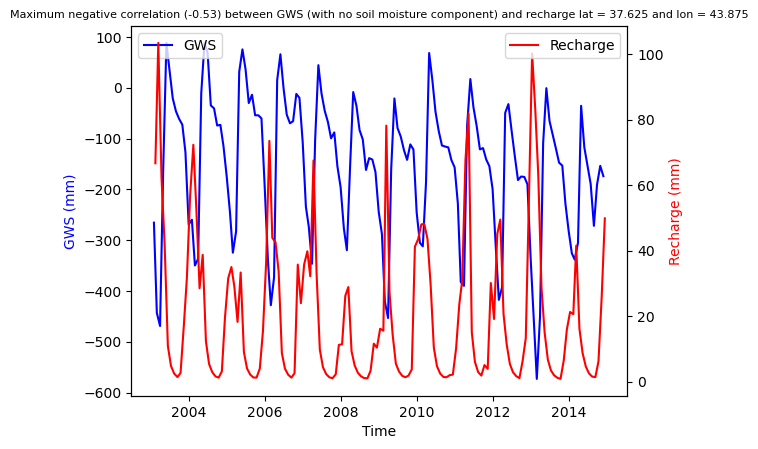

In [329]:
data1 = df1.iloc[:, 3:]
data2 = df2.iloc[:, 3:]

# Transpose the DataFrames so that the time component becomes the index
data1 = data1.T
data2 = data2.T

# Convert the index of each DataFrame to a proper datetime format
data1.index = pd.to_datetime(data1.index)
data2.index = pd.to_datetime(data2.index)

# Create a figure object and add two axes to it
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

#Specify the axis
index = 2143

# Plot the two time series on separate axes
ax1.plot(data1.iloc[:, index], label='GWS', color='b')
ax2.plot(data2.iloc[:, index], label='Recharge', color='r')

# Add axis labels and title
ax1.set_xlabel('Time')
ax1.set_ylabel('GWS (mm)', color='b')
ax2.set_ylabel('Recharge (mm)', color='r')
plt.title('Maximum negative correlation (-0.53) between GWS (with no soil moisture component) and recharge lat = 37.625 and lon = 43.875', fontsize=8)

# Add a legend and display the plot
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()
